In [7]:
import csv
import pandas as pd
from Bio import SeqIO
from Bio.SeqRecord import SeqRecord

# Between control and extreme

In [202]:
excel_file = "annotation_less_than_0.05_new_model_1.xlsx"

In [203]:
df = pd.read_excel(excel_file, sheet_name = "Sheet9")

In [204]:
gene_ids = df['PI'].tolist()
gene_ids = tuple(gene_ids)
#sep ='|'
gene_ids
len (gene_ids)

763

In [205]:
#for i in gene_ids:

    #stripped = i.split(sep, 1)[0]
    #gene_idss.append(stripped)

In [206]:
gene_idsss = [str(num) for num in gene_ids]
gene_idsss = tuple(gene_idsss)
gene_idsss

('1380427',
 '1223813',
 '874328',
 '988953',
 '1012836',
 '1036561',
 '673036',
 '993463',
 '960417',
 '1031107',
 '1404005',
 '1021515',
 '778756',
 '976835',
 '42677',
 '1068614',
 '672872',
 '43629',
 '917914',
 '1203088',
 '1391508',
 '1137921',
 '1400417',
 '980920',
 '1155217',
 '153015',
 '1079314',
 '1043243',
 '1047619',
 '1174234',
 '1248102',
 '1060440',
 '1006453',
 '1160414',
 '1095251',
 '1391396',
 '1144506',
 '1088958',
 '1231390',
 '1015798',
 '628223',
 '1083510',
 '875898',
 '675757',
 '1066102',
 '904742',
 '1194184',
 '1074335',
 '1194158',
 '1035899',
 '83691',
 '1058224',
 '962978',
 '614685',
 '980728',
 '1067271',
 '1385238',
 '97289',
 '848865',
 '1399949',
 '848852',
 '956865',
 '659347',
 '803977',
 '1066161',
 '1043428',
 '1050757',
 '1070075',
 '1012322',
 '1377488',
 '1004209',
 '128628',
 '796465',
 '1046068',
 '662204',
 '970394',
 '1115439',
 '1022506',
 '841189',
 '977461',
 '1067702',
 '1223925',
 '1071519',
 '1059124',
 '786216',
 '1083505',
 '9825

In [207]:
gtf_file = "/Users/ramya_ragunathan/Documents/Research/ballgown/M/M.gtf"

Geting protein sequences from gene IDS that are already annotated

In [208]:
#protein_file = "/Users/ramya_ragunathan/Downloads/Ent11IV18_1_GeneModels_FilteredModels1_aa.fasta"
protein_file = "Ent11IV18_1_GeneModels_FilteredModels1_aa.fasta"

In [209]:
output_file_annotated = "geneID_new_model_1.fasta"

In [210]:
def read_fasta(file):
    """
    Reads a FASTA file into a dictionary.

    Args:
        file: The path to the FASTA file.

    Returns:
        A dictionary where the keys are the sequence IDs and the values are the sequences.
    """
    sequences = {}
    with open(file) as f:
        sequence_id = None
        sequence = ''
        for line in f:
            if line.startswith('>'):
                
                if sequence_id:
                    sequences[sequence_id] = sequence
                sequence_id = line.split(sep, 4)[2]
                #sequence_id = f'|{sequence_id}|'
                
                sequence = ''
            else:
                sequence += line.strip()
        sequences[sequence_id] = sequence
    return sequences


In [211]:
sep ='|'
fasta_file = protein_file
sequences = read_fasta(fasta_file)
sequences

{'1000000': 'MQVHRTTYVAGQDQSRLAQVAKDFGLEEPRRPKDRFIGDDKGNQGGQGRMPMPSWVKASMRSMKSMMTDDTMTAARMHSVGVMGFDEAMNYDESGAFHLVTIRRRRTTLGVHRQEKSTPSLFGSNNMFAPPKRPGRSLRDMGTVEEEQEEELEDEIEEDDDEEEEEVATGGSLQAAVFGIIKATVGPAILFLPRGFVVSGYAVAVPAMIFATALFIYNSYRLLDCWEAESQRNERIVETRALLLGGGKMDETDNTEGGSNGTKRYDGGASNTLSTAQPKLLTYPELARRGLGRFAFLVDFGIASLQFGVTLTCLIFVPQNLHEFTKTTTGINLPSIFFVLLMLLIVTPLTWIRDIRKFTPTNVLATILTAYGLAAVLGVAFVAGFQPSENGESIAFVQNLKTLPAFTSSWFIFIGTSFYMMEGAITLLVPLQQAIQRKEDRAKFPKVNERVTIGIVTFYMIFCMISIAAFGMSIETALTASLTGFVANTTQLAYSINVILTFPLQAFPALEVACQAVGIGQKAEDNFRRNVFATLVTFTLGAIAVVAYDYLDIVVSLLGSLFGVPLALMFPPIMHNNLVPNSSPTRKFMNKLVVCFGFVAMAFTSISTIASINS*',
 '1000004': 'MKYAIFRWIFFSHVVAQLCLSIDNCSDNNVCLNDIEGERRRCGMDKLFCNSSSNLIEEEDGFFNSLQSLLLLAKPNNFKSIYNFGGSAQAYKPNAPMSYNICDPSLYEKSTQHNMAVWSFSRNRMKTTPKISLTIKVWVCENTELQMNDCCCNLLEEDDDEDVLVEAWSARPDGIYSSLRPGKEEGDCRSRAFVDHKTSMVTLETVAPGSHGSLGGLVPSAMFDWAPYGPPLLHLLISAPRYSPIPLLVDIPILFDPDTLHQKDFGVDWTGHAWMKSVRSHSTDDVSRSSFSPVRISSWNGLSQENKINVTIDAFIEKISASTTIQKEYQKYNFTNSPSMFCDSWFYGMPSSFFIE

In [212]:
protein_sequences = {}
for gene_id in gene_idsss:
    print(gene_id)
    protein_sequence = sequences[gene_id]
    protein_sequences[gene_id] = protein_sequence

1380427
1223813
874328
988953
1012836
1036561
673036
993463
960417
1031107
1404005
1021515
778756
976835
42677
1068614
672872
43629
917914
1203088
1391508
1137921
1400417
980920
1155217
153015
1079314
1043243
1047619
1174234
1248102
1060440
1006453
1160414
1095251
1391396
1144506
1088958
1231390
1015798
628223
1083510
875898
675757
1066102
904742
1194184
1074335
1194158
1035899
83691
1058224
962978
614685
980728
1067271
1385238
97289
848865
1399949
848852
956865
659347
803977
1066161
1043428
1050757
1070075
1012322
1377488
1004209
128628
796465
1046068
662204
970394
1115439
1022506
841189
977461
1067702
1223925
1071519
1059124
786216
1083505
982586
1076221
619158
928466
1203587
969429
1042132
1389898
1012327
1234286
1076619
1392461
983741
1060312
1227023
750893
1042127
1066119
1002120
1282232
1039924
93931
637770
913577
762021
1004891
1085018
1041303
1249543
1074470
1080423
1074760
943755
249875
957168
669155
1170422
1048483
1041149
1089276
998360
1021564
969148
1073964
1222067
1238412

KeyError: '\\'

In [196]:
len(protein_sequences)

1535

In [197]:
key_list=list(protein_sequences.keys())
val_list=list(protein_sequences.values())
ofile = open(output_file_annotated, "w")

for i in range(len(val_list)):
    ofile.write(">" + key_list[i] + "\n" +val_list[i] + "\n")

#do not forget to close it
ofile.close()

To extract protein sequences

In [7]:
import pandas as pd
excel_file ='Real_genes_less_than_0.05_new_model.xlsx'
df = pd.read_excel(excel_file, sheet_name = "Unannotated")
gene_ids = df['proteinID'].tolist()
gene_ids = tuple(gene_ids)
sep ='|'

In [8]:
gene_idsss = [str(num) for num in gene_ids]
gene_idsss = tuple(gene_idsss)
protein_sequences = {}
for gene_id in gene_idsss:
    protein_sequence = sequences[gene_id]
    protein_sequences[gene_id] = protein_sequence

In [10]:
key_list=list(protein_sequences.keys())
val_list=list(protein_sequences.values())
ofile = open("Unannoted_new_model.fasta", "w")

for i in range(len(val_list)):
    ofile.write(">" + key_list[i] + "\n" +val_list[i] + "\n")

#do not forget to close it
ofile.close()

# Between 5 and 10

In [191]:
excel_file = "regulated genes between control and 10.xlsx"

In [212]:
df = pd.read_excel(excel_file, sheet_name = "dd")

In [213]:
gene_idsn =((df['gene_IDS']).tolist())
gene_idsn = tuple(gene_idsn)
sep ='.'

In [214]:
gene_idsn

(1010620,
 850861,
 1063166,
 1380427,
 822071,
 1223813,
 1066470,
 874328,
 1062170,
 1073050,
 988953,
 1389125,
 1020086,
 1018724,
 71962,
 1018908,
 1038598,
 1015235,
 1063263,
 967835,
 1012836,
 1036561,
 673036,
 609439,
 1017893,
 993463,
 959155,
 960417,
 920852,
 1065269,
 1031107,
 1019479,
 757197,
 969824,
 1056213,
 1075601,
 1404005,
 1021515,
 955142,
 778756,
 1082848,
 1401909,
 1054968,
 882913,
 993817,
 1059113,
 976835,
 181930,
 827449,
 977828,
 1036788,
 977612,
 940258,
 958643,
 1044917,
 1230009,
 993518,
 42677,
 1068614,
 1226265,
 1089975,
 960521,
 1078964,
 349456,
 672872,
 954256,
 1005843,
 43629,
 917914,
 1050279,
 1203088,
 1391508,
 1087708,
 1037724,
 1137921,
 1222220,
 1028215,
 1400417,
 1017675,
 975798,
 980920,
 1025034,
 980919,
 1155217,
 1009854,
 153015,
 898167,
 1087724,
 1012284,
 1224555,
 1020793,
 1079314,
 977109,
 1043243,
 883475,
 1047619,
 1010657,
 1174234,
 1248102,
 1083519,
 1060440,
 1006453,
 1160414,
 815640,
 995

In [215]:
gene_idsss = [str(num) for num in gene_idsn]
gene_idsss = tuple(gene_idsss)

In [5]:
protein_file = "/Users/ramya_ragunathan/Downloads/Ent11IV18_1_GeneModels_FilteredModels1_aa.fasta"

In [6]:
output_file_annotated = "Downregulated_010.fasta"

In [7]:
def read_fasta(file):
    """
    Reads a FASTAo e file into a dictionary.

    Args:
        file: The path to the FASTA file.

    Returns:
        A dictionary where the keys are the sequence IDs and the values are the sequences.
    """
    sequences = {}
    with open(file) as f:
        sequence_id = None
        sequence = ''
        for line in f:
            if line.startswith('>'):
                
                if sequence_id:
                    sequences[sequence_id] = sequence
                sequence_id = line.split(sep, 4)[2]
                sequence = ''
            else:
                sequence += line.strip()
        sequences[sequence_id] = sequence
    return sequences

In [219]:
protein_sequences_1 = {}
for gene_idn in gene_idsss:
    protein_sequence = sequences[gene_idn]
    protein_sequences_1[gene_idn] = protein_sequence

In [220]:
len(protein_sequences_1)

930

In [221]:
key_list=list(protein_sequences_1.keys())
val_list=list(protein_sequences_1.values())
ofile = open(output_file_annotated, "w")

for i in range(len(val_list)):
    ofile.write(">" + key_list[i] + "\n" +val_list[i] + "\n")

#do not forget to close it
ofile.close()

# Plotting bar charts

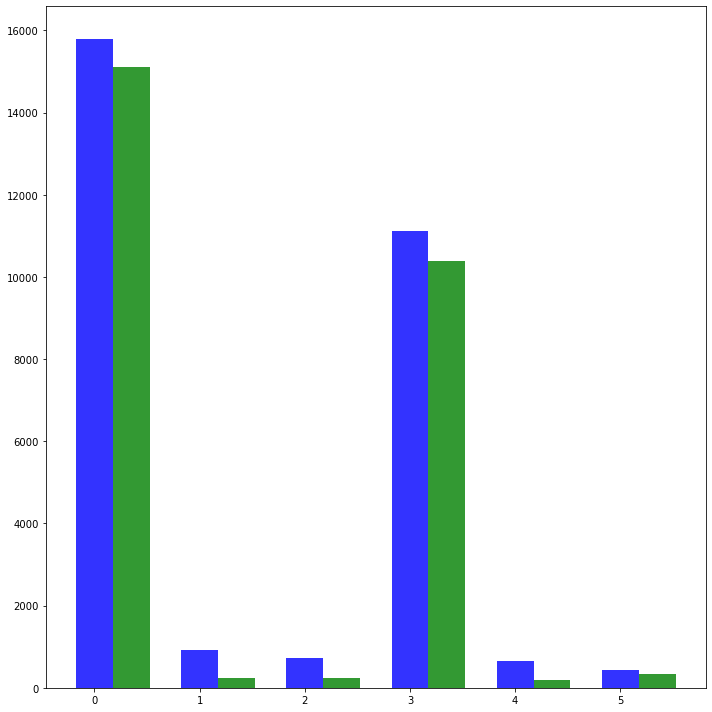

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# data to plot
n_groups = 6
values_extremes = (15794,930,720,11128,658,431)
values_nonextremes = (15104,236,234,10393,178,334)

# create plot

fig, ax = plt.subplots(figsize=(10,10))
index = np.arange(n_groups)
bar_width = 0.35
opacity = 0.8

rects1 = plt.bar(index, values_extremes, bar_width,
alpha=opacity,
color='b',
label='RNA seq between 10 micromolar versus 0 micromolar concentration')

rects2 = plt.bar(index + bar_width, values_nonextremes, bar_width,
alpha=opacity,
color='g',
label='RNA seq between 10 micromolar versus 5 micromolar concentration')

#plt.xlabel('Transcripts in annotation                   De-novo transcripts', fontsize =16)
#plt.ylabel('Number of transcripts')

#plt.xticks(index + bar_width,('Total number of transcripts', 'unpregulated','downregulated','Total number of transcripts', 'unpregulated','downregulated'))
#plt.xticks(rotation= 90)
plt.tight_layout()

plt.show()

End of extraction annotated proteins

Comparing both

In [177]:
#gene_idsn and gene_ids
common = []

In [178]:
for gene_id in gene_ids:
    for i in gene_idsn:
        if gene_id == i:
            common.append(str(i))

NameError: name 'gene_idsn' is not defined

In [85]:
newlist = []
for i in range(49):
    commons = common[i]
    newlist.append(str(commons))

In [98]:
for i in newlist:
    del protein_sequences[i]

In [81]:
len(protein_sequences)

1650

In [ ]:
newlist =[]

In [21]:
import pandas as pd 
import math
excel_file = "Book1.xlsx"
df = pd.read_excel(excel_file, sheet_name = "Sheet2")



gene_idscc = df['10 Al'].tolist()
df

,10 Al
0,850861
1,1018908
2,1038598
3,1063263
4,609439
...,...
108,812750
109,992014
110,756403
111,1002441


In [26]:
excel_file= 'regulated genes between control and 10.xlsx'
df = pd.read_excel(excel_file, sheet_name = "Final_list_annotated_less than ")
gene_idsn =((df['gene_IDS']).tolist())
gene_idsn = tuple(gene_idsn)
gene_idsss = [str(num) for num in gene_idsn]
gene_idsss = tuple(gene_idsss)
protein_sequences_1 = {}
for gene_idn in gene_idsss:
    protein_sequence = sequences[gene_idn]
    protein_sequences_1[gene_idn] = protein_sequence
len(protein_sequences_1)

1650

In [176]:
for i in gene_idscc:
    i= str(i)
    del protein_sequences_1[i]
protein_sequences_1

NameError: name 'gene_idscc' is not defined

In [28]:
import pandas as pd

df = pd.DataFrame(protein_sequences_1,index=[1])

df = df.T
df
#convert into excel
df.to_excel("Real_genes_less_than_0.05_new_model1.xlsx")
#print("Dictionary converted into excel...")

End of comparison

# Getting protein sequences of uncommon annotated genes

In [76]:
#excel_file = "Real_genes.xlsx"
excel_file = "tmhmm_signalp_all.xlsx"
import pandas as pd


In [88]:
#df = pd.read_excel(excel_file, sheet_name = "List of unannotated genes")
df = pd.read_excel(excel_file, sheet_name = "Sheet4")
df

,Gene ID,Len,ExpAA,First60,PredHel,topology
0,|101036|,len=346,ExpAA=22.80,First60=0.00,1,Topology=o305-327i
1,|1019502|,len=214,ExpAA=19.79,First60=0.07,1,Topology=o188-210i
2,|1072820|,len=424,ExpAA=22.70,First60=0.00,1,Topology=i165-187o
3,|1079744|,len=132,ExpAA=17.93,First60=0.02,1,Topology=i97-119o
4,|1080439|,len=163,ExpAA=20.46,First60=20.32,1,Topology=o33-55i
...,...,...,...,...,...,...
279,|887338|,len=632,ExpAA=22.17,First60=0.02,1,Topology=o577-599i
280,|929392|,len=437,ExpAA=22.68,First60=0.00,1,Topology=i322-344o
281,|950366|,len=1349,ExpAA=18.28,First60=0.00,1,Topology=o786-808i
282,|951438|,len=1282,ExpAA=22.89,First60=0.07,1,Topology=o722-744i


In [89]:
sequences

{'|1000013|': 'MAEAMLPHRTTTDGAVITGIELWNFMLEEVQPYRTTIIGSTGPVLAFTKAVVSIADNIGVPFITFQAWISCWLLFYCCAAAFFDLTRVVRLATRFTDEIFAFLIVSIFVLDSVGDPFSQVGILRYFNPEHKSHDDFEDDASLL*',
 '|1000033|': 'MSYVDMVVAHHGNDHSNSSAPPPKPPQDKAFYRQTTPSKPPLYLFGNQPSKRHHHPKRHRYRLYLAHMKSIFSETSDNPIYNHPPQRKNHNKSLQTKPSPKSTFSNPPPLLPPLQLAPNNRLTPPPPVTILKTYTFDITPPQPHVFLAVYTTQAIPNNPPTPPIISTNHFPPQPSSFLTFLLPQHSSPIQPTKSDKASCLTTEPYTTTTNWWIPTSNTTNYQPTTLNLCTNIDSSRWPVLVNNSIHKPFSDKYISQIYCLLANIQQAQQAIFQKLTNHHF*',
 '|1000086|': 'MFKLEHLWVAGLGSSAWLDTIEAEMYALNDQIRACRSEIETGLYTSAFGAYCLPVDIVSNSHLQTLRHFGVPILDNFYIKGLIRDLRNHQQTTSTPEKSLFNYESNDGKQQVLIKVDKEKQNDVYWSLEDNKCIDESCDPNASIPPEELSAQWLFQLLGSCYRKRMMVLDKEAKLDNVALTALMADSNITFGVKSLLLITSVSPDQYIFPILHIQLGLGNHIDEEIFKLVKLVHDIPTQQHKLMEEYIQLVHVLEQKQDSVDKWYTTGNGSCFTKFHSNLSAFLDQLSQPNLNKTSYIKNYRITVFSYHGGNFEADSIQQFMIHGNKIIGYITEMFFEKVEKEDIELSLKCPGFQKCRGLSDFSEDFVERSHQVGVKNEKRIHRWKDFSKKATFYAFWEGIVGTKEVQDIQKTRAIKKREVQK*',
 '|1000113|': 'MSTTNAQSLSLIEEEDDEQEQNYHNSFTSYNSYTSYNSHTTYNLYNNDDNDDDDNNINSSNQLKNNKKKGPTNRARLNHDHL

In [84]:
sequences['|951600|']

'MIQFWNGLWRIESVPKIMKVMKTFKSILAAILIVGTAGFLMSCESELESKGTASIGVTDAAVDAENISGVYLKVNEVQATAQGKTKTVVAFDSPKTFNVMDYQNGATYDLGEGHIDAGSYVKFKDGTTADLDVPSGTTSGYKVKGDYEINSDSRTNLVVDIDLRKAFVKTGSGEYKLRPTARIVNKDRSAVINGTVSGNTADKVVVYAYEKGTYKESETAEPADGESRFENSINSAVVANGQFTMAYMEEGEYDLIAVAYDENPEEDTYAFRSASEVDMMVAGSLLSVLKVEANANINSTNLQRFDGWQEENATFLMEANDLTLLLQNLSTLAMTEANRRDTYLTAEEAYPEFQNLLLDFKIEAAARRVKLSSVLSKDNDLIYQQLRTAQKDDFDSLYQKIMLQKIAELQSISEDYTLKGHNEGLKDFSAGFITYRNLEEIVSKLETDDRSNENLLQYKEILVNLHDMENQVESYELTSDPKYIERYNRSISRVFARVDSINGLNQTDTELLVFNDSLRSLINEKTFTLNQLIDFRSNQDQDDFKELEGFLDAISANPIPPAQTTKDTARVTEPETEEKKGFFKRLLAKKPEPVAEPEVNQDSIFLAEKKQYHSQINSKVDQMRSSQRLISQRQREKEMNLLSAHFGIQNQIIDLVTFLESRETTKVKIKAIKAKELANQTSQQITLFFSLATLLLLSSVIMMVTYVQRNGRYQELLRESKKSAETLAKAKERFFANMSHEIRTPMNAISGFTKVLLRTELKEEQKEQVEIIHKSSEHLLRLLNDILDFSKLQAEKLQLETTPFSIRQVCDDSITLLKASAAHKGLKLY'

In [90]:
gene_ids = df['Gene ID'].tolist()
gene_ids = tuple(gene_ids)
gene_idsss = [str(num) for num in gene_ids]
gene_idsss = tuple(gene_idsss)
output_file_annotated = "tmhmm_signalp_1.fasta"
protein_sequences_2 = {}
for gene_idn in gene_idsss:
    print(gene_idn)
    protein_sequence = sequences[gene_idn]
    protein_sequences_2[gene_idn] = protein_sequence


|101036|
|1019502|
|1072820|
|1079744|
|1080439|
|1086618|
|1093032|
|1093126|
|1094652|
|1094733|
|1094928|
|1094941|
|1095220|
|1095564|
|1095901|
|1096351|
|1096677|
|1097410|
|1097561|
|1097653|
|1098076|
|1098170|
|1098773|
|1099679|
|1100441|
|1102716|
|1102819|
|1102949|
|1102994|
|1103257|
|1103935|
|1109542|
|1109605|
|1110042|
|1110445|
|1110446|
|1110454|
|1110603|
|1111159|
|1111240|
|1111417|
|1112670|
|1113017|
|1115065|
|1115985|
|1115990|
|1116037|
|1116143|
|1116298|
|1116827|
|1117054|
|1117115|
|1117168|
|1119206|
|1119247|
|1124590|
|1124667|
|1124670|
|1124835|
|1124955|
|1125019|
|1125425|
|1126009|
|1126090|
|1126217|
|1126853|
|1127112|
|1129175|
|1129346|
|1129553|
|1129563|
|1130489|
|1130588|
|1130668|
|1131284|
|1132574|
|1135306|
|1136965|
|1137380|
|1139672|
|1140342|
|1141003|
|1141028|
|1141442|
|1142572|
|1143740|
|1143778|
|1143921|
|1144025|
|1144037|
|1146244|
|1146376|
|1148257|
|1152710|
|1153493|
|1154074|
|1154332|
|1155558|
|1155560|
|1156300|
|

In [91]:
key_list=list(protein_sequences_2.keys())
val_list=list(protein_sequences_2.values())
ofile = open("tmhmm_signalp_1.fasta", "w")

for i in range(len(val_list)):
    ofile.write(">" + key_list[i] + "\n" +val_list[i] + "\n")

#do not forget to close it
ofile.close()



In [92]:
len(protein_sequences_2)

284

# Importing annotation

In [6]:
#GO annotation dictionary
import pandas as pd
excel_file="Real_genes_less_than_0.05_new_model.xlsx"
my_dict = {}
df = pd.read_excel(excel_file, sheet_name = "Sheet4")
df1 = pd.read_excel(excel_file, sheet_name = "Sheet1")
gene_ids = df1['proteinID'].tolist()
for index, row in df.iterrows():
    key =(row["proteinId"])
    values = (row["goName"])

    if key in gene_ids: 
        if key in my_dict:
            my_dict[key] = list(set(my_dict[key] + [values]))
        else:
            my_dict[key] = [values]

In [7]:
my_dict

{9978: ['binding'],
 28617: ['peptidyl-prolyl cis-trans isomerase activity', 'protein folding'],
 30680: ['peroxisome organization and biogenesis',
  'integral to peroxisomal membrane'],
 46696: ['agmatine deiminase activity'],
 59104: ['anion transport',
  'integral to membrane',
  'anion exchanger activity'],
 59122: ['anion transport',
  'integral to membrane',
  'anion exchanger activity'],
 145372: ['protein transporter activity',
  'integral to membrane',
  'protein transport'],
 146406: ['nucleotide binding',
  'nucleoside-triphosphatase activity',
  'ATPase activity',
  'ATP binding'],
 157427: ['membrane'],
 162792: ['protein binding'],
 305710: ['oxidoreductase activity', 'coenzyme binding'],
 386774: ['pilus biogenesis', 'outer membrane'],
 409175: ['oxidoreductase activity', 'electron transport'],
 626300: ['protein binding',
  'ubiquitin-protein ligase activity',
  'zinc ion binding',
  'regulation of ubiquitin-protein ligase activity during meiotic cell cycle',
  'regulat

In [10]:
df = pd.DataFrame.from_dict(my_dict, orient='index')
df
#excel_file = 'GO_type.xlsx'
#df.to_excel(excel_file, index=False)

,0,1,2,3,4,5,6,7,8,9,...,38,39,40,41,42,43,44,45,46,47
9978,binding,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
28617,peptidyl-prolyl cis-trans isomerase activity,protein folding,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
30680,peroxisome organization and biogenesis,integral to peroxisomal membrane,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
46696,agmatine deiminase activity,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
59104,anion transport,integral to membrane,anion exchanger activity,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1397038,pyridoxine 4-dehydrogenase activity,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1398103,copper ion transmembrane transporter activity,integral to membrane,copper ion transport,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1398812,protein retention in ER,ER retention sequence binding,integral to membrane,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1401226,protein binding,zinc ion binding,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


Interpro annotation


In [11]:
my_dict_IP = {}
excel_file = "Real_genes.xlsx"
df = pd.read_excel(excel_file, sheet_name = "Sheet3")
for index, row in df.iterrows():
    key = row['#proteinId']  # Replace 'key_column' with the actual column name for the keys
    value1 = row['iprDesc']  # Replace 'value1_column' with the actual column name for the first set of values
    value2 = row['domainDesc']  
    my_dict_IP[key] = (value1, value2)

In [12]:
import pandas as pd
excel_file="Real_genes.xlsx"
excel_file_1="Real_genes_less_than_0.05_new_model.xlsx"
my_dict_IP = {}
df = pd.read_excel(excel_file, sheet_name = "Sheet3")
df1 = pd.read_excel(excel_file_1, sheet_name = "Sheet1")
gene_ids = df1['proteinID'].tolist()
for index, row in df.iterrows():
    values =(row["domainDesc"])
    key = (row["#proteinId"])

    if key in gene_ids: 
        if key in my_dict_IP:
            my_dict_IP[key] = list(set(my_dict_IP[key] + [values]))
        else:
            my_dict_IP[key] = [values]

In [13]:
my_dict_IP[999264]

['\\N', 'Saccharopine dehydrogenase']

In [16]:
excel_file = "Book1.xlsx"
df = pd.read_excel(excel_file, sheet_name = "Sheet2")
protein_Id =df['10 Al'].tolist()
protein_Id
#protein_Id=list(protein_sequences_1.keys())

[850861,
 1018908,
 1038598,
 1063263,
 609439,
 920852,
 969824,
 882913,
 940258,
 1230009,
 1037724,
 1028215,
 977109,
 815640,
 1038500,
 999302,
 1026197,
 933415,
 148926,
 1009052,
 959121,
 1010575,
 786184,
 1007348,
 959706,
 978145,
 1217348,
 1056409,
 974874,
 874716,
 1011306,
 989342,
 970153,
 1013789,
 980775,
 1062991,
 1046414,
 1378492,
 1039871,
 1004700,
 1072792,
 1040050,
 1038484,
 1007379,
 1005421,
 871810,
 836083,
 269003,
 1013539,
 954443,
 960211,
 984262,
 1045417,
 333071,
 1031943,
 1017889,
 1044422,
 1085244,
 1271815,
 1059248,
 1228814,
 1002686,
 1228813,
 156123,
 1256092,
 873191,
 884682,
 884645,
 1067172,
 997445,
 1402632,
 1391536,
 927906,
 1236243,
 1013999,
 1011120,
 982617,
 1029582,
 1003728,
 976633,
 1043427,
 976141,
 1004244,
 1056284,
 1220605,
 156996,
 981062,
 794094,
 959622,
 1241043,
 968804,
 1043720,
 1091052,
 59104,
 59122,
 963797,
 1010083,
 1032155,
 1085254,
 1074487,
 1024229,
 846264,
 1014203,
 1020841,
 961461

Signalp

In [18]:
my_dict_signalp = {}
excel_file = "Real_genes.xlsx"
df = pd.read_excel(excel_file, sheet_name = "Sheet2")
for index, row in df.iterrows():
    key = row['proteinid_signalp']  # Replace 'key_column' with the actual column name for the keys
    value1 = row['values']  # Replace 'value1_column' with the actual column name for the first set of values 
    my_dict_signalp[key] = value1

In [41]:
 my_dict_signalp

{1091286.0: 'yes',
 1091300.0: 'yes',
 1091460.0: 'yes',
 1280986.0: 'yes',
 1092658.0: 'yes',
 1092665.0: 'yes',
 1089975.0: 'yes',
 1089987.0: 'yes',
 1089765.0: 'yes',
 1086216.0: 'yes',
 1093601.0: 'yes',
 1092815.0: 'yes',
 611856.0: 'yes',
 1246431.0: 'yes',
 1092562.0: 'yes',
 1093189.0: 'yes',
 1093106.0: 'yes',
 1280079.0: 'yes',
 1233026.0: 'yes',
 1092904.0: 'yes',
 1092907.0: 'yes',
 1279595.0: 'yes',
 1093146.0: 'yes',
 1092385.0: 'yes',
 923952.0: 'yes',
 1091528.0: 'yes',
 867871.0: 'yes',
 1282194.0: 'yes',
 1233219.0: 'yes',
 1092372.0: 'yes',
 1093435.0: 'yes',
 406314.0: 'yes',
 1092700.0: 'yes',
 1091624.0: 'yes',
 922640.0: 'yes',
 922633.0: 'yes',
 923475.0: 'yes',
 1213053.0: 'yes',
 347011.0: 'yes',
 1092214.0: 'yes',
 1212367.0: 'yes',
 1090337.0: 'yes',
 1088708.0: 'yes',
 1089369.0: 'yes',
 1091123.0: 'yes',
 1088922.0: 'yes',
 923651.0: 'yes',
 349749.0: 'yes',
 1090379.0: 'yes',
 1090637.0: 'yes',
 1090628.0: 'yes',
 1090618.0: 'yes',
 867900.0: 'yes',
 806

In [19]:
my_dict_KEGG = {}
excel_file = "KEGG.xlsx"
df = pd.read_excel(excel_file)
for index, row in df.iterrows():
    key = row['#proteinId']  # Replace 'key_column' with the actual column name for the keys
    value1 = row['definition']  # Replace 'value1_column' with the actual column name for the first set of values
    value2 = row['pathway']  
    value3 = row['pathway_class']
    value4 = row['pathway_type']
    my_dict_KEGG[key] = (value1, value2, value3, value4)

In [20]:
annotation ={}
for proteinID in protein_Id:
    value1 ='Nan'
    value2 ='Nan'
    value3 ='Nan'
    value4 = 'Nan'
    key = proteinID
    default_value = "N"
    value1 =list(my_dict_IP.get(proteinID,default_value))
    value2 = list(my_dict.get(proteinID, default_value))
    value3= list(my_dict_signalp.get(proteinID, default_value))
    value4 = list(my_dict_KEGG.get(proteinID, default_value))
    annotation[key] = (value1,value2,value3, value4)

In [21]:
annotation

{850861: (['N'], ['N'], ['N'], ['N']),
 1018908: (['N'], ['N'], ['N'], ['N']),
 1038598: (['N'], ['N'], ['N'], ['N']),
 1063263: (['N'], ['N'], ['y', 'e', 's'], ['N']),
 609439: (['N'], ['N'], ['N'], ['N']),
 920852: (['N'], ['N'], ['N'], ['N']),
 969824: (['N'],
  ['N'],
  ['N'],
  ['1-phosphatidylinositol 4-kinase.',
   'Inositol phosphate metabolism',
   'Metabolism of Complex Lipids',
   'METABOLIC']),
 882913: (['N'], ['N'], ['y', 'e', 's'], ['N']),
 940258: (['N'], ['N'], ['N'], ['N']),
 1230009: (['N'], ['N'], ['N'], ['N']),
 1037724: (['N'],
  ['N'],
  ['N'],
  ['Phosphoglucomutase.',
   'Galactose metabolism',
   'Carbohydrate Metabolism',
   'METABOLIC']),
 1028215: (['N'], ['N'], ['N'], ['N']),
 977109: (['N'], ['N'], ['N'], ['N']),
 815640: (['N'], ['N'], ['N'], ['N']),
 1038500: (['N'], ['N'], ['N'], ['N']),
 999302: (['Uncharacterised protein family (UPF0041)'], ['N'], ['N'], ['N']),
 1026197: (['N'],
  ['N'],
  ['N'],
  ['Xenobiotic-transporting ATPase.', '\\N', '\\N', '

In [22]:
df = pd.DataFrame.from_dict(annotation, orient='index')
excel_file_1 = 'annotation_less_than_0.05_new_model_1_common.xlsx'
df.to_excel(excel_file_1)

In [95]:
genome_file = "/Users/ramya_ragunathan/Documents/Research/Entomoneis_sp_UTEX_11IV18_2A_FL.fasta"

In [96]:
output_file = "differentially.fasta"
sequences =[]

In [97]:
genes = {}
with open(gtf_file) as f:
    for line in f:
        if line.startswith("#"):
            continue
        fields = line.strip().split("\t")
        chrom, start, end, strand = fields[0], int(fields[3]), int(fields[4]), fields[6]
        gene_id = fields[8].split(";")[0].split()[1].strip('"')
            
        if gene_id in gene_idss:
                
            genes[gene_id] = (chrom, start, end, strand)

In [98]:
(genes)

{'MSTRG.6841': ('scaffold_2', 1542882, 1543207, '-'),
 'MSTRG.11827': ('scaffold_3', 1600936, 1602943, '+'),
 'MSTRG.11879': ('scaffold_3', 2514755, 2515131, '.'),
 'MSTRG.11936': ('scaffold_3', 3609067, 3609477, '+'),
 'MSTRG.11987': ('scaffold_3', 4658607, 4661266, '+'),
 'MSTRG.15094': ('scaffold_4', 216994, 218961, '+'),
 'MSTRG.15176': ('scaffold_4', 1442815, 1443526, '+'),
 'MSTRG.15241': ('scaffold_4', 2170145, 2171506, '-'),
 'MSTRG.15247': ('scaffold_4', 2255153, 2256224, '+'),
 'MSTRG.15254': ('scaffold_4', 2325936, 2328059, '-'),
 'MSTRG.15271': ('scaffold_4', 2549771, 2550331, '-'),
 'MSTRG.15322': ('scaffold_4', 3320692, 3321597, '-'),
 'MSTRG.15336': ('scaffold_4', 3453820, 3455028, '+'),
 'MSTRG.17622': ('scaffold_5', 325683, 329068, '-'),
 'MSTRG.17667': ('scaffold_5', 1073103, 1075674, '+'),
 'MSTRG.17698': ('scaffold_5', 1715759, 1716497, '+'),
 'MSTRG.17717': ('scaffold_5', 2151878, 2154190, '-'),
 'MSTRG.17747': ('scaffold_5', 2670280, 2673783, '-'),
 'MSTRG.17749':

In [100]:
with pysam.FastaFile(genome_file) as ref:
    with open(output_file, "w") as out:
        for gene_id, coords in genes.items():
            chrom, start, end, strand = coords
            seq = ref.fetch(chrom, start, end)
        
            if strand == "-":
                seq = seq[::-1]
            out.write(f">{gene_id}\n{seq}\n")

In [102]:
outputp_file = "differentiallyp.fasta"
### does not identify CDS. It only has the transcript length

from Bio.Seq import Seq
with pysam.FastaFile(genome_file) as ref:
    with open(outputp_file, "w") as out:
        for gene_id, coords in genes.items():
            chrom, start, end, strand = coords
            seq = ref.fetch(chrom, start, end)
            seq = Seq(seq)
            protein = seq.translate()
            if strand == "-":
                seq = seq[::-1]
                protein = seq.translate()
            out.write(f">{gene_id}\n{protein}\n")

/Users/ramya_ragunathan/opt/anaconda3/lib/python3.9/site-packages/Bio/Seq.py:3482: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [38]:
### Alternate code do not use 
from Bio import SeqIO
from Bio.SeqFeature import SeqFeature, FeatureLocation

In [46]:
# Initialize an empty list to store the sequences
sequences = []

# Read in the genome FASTA file and create a dictionary of sequences
sequences_dict = SeqIO.to_dict(SeqIO.parse(fasta_file, "fasta"))

gtf_file


'/Users/ramya_ragunathan/Documents/Research/ballgown/M/M.gtf'

In [45]:
# Iterate over the features in the GTF file
gtf_file = "/Users/ramya_ragunathan/Documents/Research/ballgown/M/M.gtf"
for feature in SeqIO.parse(gtf_file, "gff"):
    # Check if the feature is a gene and its ID is in the list of gene IDs
    if feature.type == "gene" and feature.qualifiers["gene_id"][0] in gene_ids:
        # Extract the sequence for the gene and append it to the list
        gene_seq = feature.extract(sequences_dict[feature.id].seq)
        sequences.append(gene_seq)

# Print the sequences to verify that they were extracted correctly
print(sequences)

ValueError: Unknown format 'gff'

In [28]:
!pip install pysam
import pysam

gtf_file = "/Users/ramya_ragunathan/Documents/Research/ballgown/N/N.gtf"
ref_file = "/Users/ramya_ragunathan/Documents/Research/Ent11IV82_LowInput1_GeneModels_FilteredModels1_aa.fasta"
out_file = "genes.fasta"

# Parse GTF file and extract gene coordinates
genes = {}
with open(gtf_file) as f:
    for line in f:
        if line.startswith("#"):
            continue
        fields = line.strip().split("\t")
        if fields[2] == "gene_id":
            chrom, start, end, strand = fields[0], int(fields[3]), int(fields[4]), fields[6]
            gene_id = fields[8].split(";")[0].split()[1].strip('"')
            genes[gene_id] = (chrom, start, end, strand)

# Extract gene sequences from reference genome
with pysam.FastaFile(ref_file) as ref:
    with open(out_file, "w") as out:
        for gene_id, coords in genes.items():
            chrom, start, end, strand = coords
            seq = ref.fetch(chrom, start, end)
            if strand == "-":
                seq = reverse_complement(seq)
            out.write(f">{gene_id}\n{seq}\n")


In [29]:
genes

{}

Getting protein sequences for signal p

In [12]:
import csv
import pandas as pd
df = pd.read_excel("Signalp_all_fromJGIannotation.xlsx")

In [13]:
protein_id = df['#proteinid'].tolist()

In [14]:
protein_id = tuple(protein_id)
protein_id = [str(num) for num in protein_id]
protein_id = tuple(protein_id)
output_file_annotated = "signalp_JGI.fasta"
protein_sequences = {}
for gene_idn in protein_id:
    print(gene_idn)
    protein_sequence = sequences[gene_idn]
    protein_sequences[gene_idn] = protein_sequence


1091286
1091300
1091460
1280986
1092658
1092665
1089975
1089987
1089765
1086216
1093601
1092815
611856
1246431
1092562
1093189
1093106
1280079
1233026
1092904
1092907
1279595
1093146
1092385
923952
1091528
867871
1282194
1233219
1092372
1093435
406314
1092700
1091624
922640
922633
923475
1213053
347011
1092214
1212367
1090337
1088708
1089369
1091123
1088922
923651
349749
1090379
1090637
1090628
1090618
867900
806236
922346
1089391
1092129
1090420
1090419
1090416
1090407
948067
1089277
1089266
1089260
1089421
922081
330449
1091499
923030
1090711
1087446
1086568
1086564
1391707
1085329
1088490
1086296
1086286
1086269
1208348
1088372
1088468
1088461
947012
1089805
1231457
1081705
864376
1090663
1093348
1088079
1088061
1079140
1087724
1087708
1087701
1207777
1089120
1089114
867916
1084131
1088021
1088016
1088014
1089607
867432
1089591
1088186
1088175
349456
1090292
1090253
1083893
300921
300890
1082746
1084155
1084154
1087639
1276937
1088834
1088807
1089108
1089095
660408
1089183
1080076
3

1051931
150261
1055057
1055045
1055025
1054934
1054927
1054907
1054897
161111
1386407
1039332
938669
1241546
1040279
903728
1040136
1040126
1040952
904133
1040930
1040918
1040882
1040850
1040821
1027047
1027012
1026857
1026850
1026722
1026710
1044014
1043909
1168444
849822
788569
1043843
1043834
1043821
1043820
1019702
1019691
1019687
1019686
1019647
1019646
1019630
896194
1019509
1222934
1019479
1022731
23827
1038340
1038323
1038287
1041202
1041192
1041127
1041081
1041061
938887
1040101
1040075
1039955
1039914
903574
1039829
1013847
1013819
1013817
1013764
419777
1013727
837481
1013687
1013685
1013677
1013656
1013649
1013642
1013621
1013590
1018049
1018047
776416
1018602
1018577
1018548
600720
1385648
1030596
937501
54380
1032130
1032079
1031987
1031952
56390
1031897
1031863
1031812
1031806
634822
52248
1029406
1157222
1029285
1044523
1025295
1384960
1025275
1240306
1025136
1025133
1025116
779595
1025071
1025034
1032606
1032596
57530
1032527
1385725
1224513
1032369
1032274
1032226
102

669323
972588
972530
972223
972085
1109314
971925
971635
971312
929763
1380423
1269186
983744
257471
983725
983715
760471
983524
983402
983338
983316
983306
983236
983182
983178
988462
988450
1122390
1218569
988395
988359
988349
988320
286318
988184
988149
762180
988103
988098
988025
988024
988021
988008
988007
988005
987984
661420
987928
987915
99755
969145
969119
969063
969056
969046
969045
99108
927232
968926
968930
968896
968855
753078
968805
968758
968755
968754
818855
876110
636555
968655
97562
968543
975321
975317
975292
166702
975257
975252
975214
975212
975195
975189
975175
975169
975161
631229
975096
1216526
975070
975054
975052
1216515
974994
974968
974958
974932
974918
1235364
820870
974870
974839
974837
974835
974753
974737
974734
164481
1109863
974690
974685
974680
977324
977315
977303
977262
977213
977212
757027
977191
189713
189712
977134
977088
1112462
976980
976965
976955
976937
976892
976867
879158
1394619
1216194
970476
1235129
927555
877048
877038
1216162
970149
97

In [15]:
key_list=list(protein_sequences.keys())
val_list=list(protein_sequences.values())
ofile = open("protein_regulated_unannotated_uncommon.fasta", "w")

for i in range(len(val_list)):A
    ofile.write(">" + key_list[i] + "\n" +val_list[i] + "\n")

#do not forget to close it
ofile.close()

In [20]:
protein_sequences.to_excel('JGI_signalp_sequences.xlsx')

AttributeError: 'dict' object has no attribute 'to_excel'

In [25]:
dff = pd.DataFrame(protein_sequences,index=[1]).T
dff.to_excel('JGI_signalp_sequences.xlsx')

In [1]:
from Bio import SeqIO

def filter_sequences_by_id_prefix(fasta_file, id_prefix):
    """
    Filters out sequences from a FASTA file based on the ID prefix.

    Parameters:
        fasta_file (str): The path to the FASTA file.
        id_prefix (str): The prefix to filter the sequence IDs.

    Returns:
        list: A list of Biopython SeqRecord objects whose IDs start with the specified prefix.
    """
    sequences_with_prefix = []
    with open(fasta_file, "r") as handle:
        for record in SeqIO.parse(handle, "fasta"):
            if record.id.startswith(id_prefix):
                clean_id = record.id[len(id_prefix):] 
                sequences_with_prefix.append(record)
    return sequences_with_prefix

# Example usage:
fasta_file_path = "Diatoms_and_related_Ochrophyta.6062.fasta"
id_prefix_to_filter = "jgi|Ent11IV18_1|"
sequences_with_prefix = filter_sequences_by_id_prefix(fasta_file_path, id_prefix_to_filter)


ofile = open("unique_to_diatoms.fasta", "w")

#do not forget to close it



# Print the sequences that match the ID prefix
for record in sequences_with_prefix:
    ofile.write(f">{record.id}" + "\n" +f"{record.seq}" + "\n")
    print(f">{record.id}")
    print(record.seq)
ofile.close()

>jgi|Ent11IV18_1|955362
MIVIENSCGTNWTFLVNNEKDLILLGEGDLHDPLYTDMVHSTTYDDYENIIRLFSPSTEYNTEKTPSLFGPDGWDDLGSCRYRLLVYPTKAFEEDFNDGSEHHGFIYTIIAISTLAIVLALFIVYDYFVQRRQRRMMLSNQKSSAVVSSLFPKDVRDRILDEAPGLSASKFYNSSASFSGNNNSINNNFLNIRRRNSLTASMESASLASPSRIAAAQINNDRNSKWLPFDGSPPIAQQYTDTTIMFLDLAGFTAWSSEREPSDVFLLLESLYHSFDESAQRYGVFKIETIGDSYVAACGVPTKRSDHAVIMCRFARDCMKRMNRLTRFLEIQLGPSTADLKARVGLHSGSVTGGVLRGEKSRFQLFGDTMNVAARMESTGTAGNIQLSAATADLLIEAGKGHWLEPRQELVIAKGKGQMQTFWCHLSTRRGSESNFSEISENFVSSESLSDIGQDVEFPVLGDKMPQSMRYVEWTVDILYDLLTKLVVSRTTKASSGLPKFLSNHSINSVDADPTDLEDAQFIRRPAIEELVDYIEMPRFDARTVRKMSLGGGNSGHSNPNEVHLDEEIRSQLFEYIMRISSMYRDVPFHNFEHAAHVAMSANKFLRRILNRNQAGEEQVVESASTRKSVDAARQTHRLTFGISSDPLMHFAIVLAAVIHDVDHPGLPNDQLEKMKTPAAVIYKGRSIAEQNSVEVAWRVLMDEDFGKLRGTIYTSKDEMRRFRLLIVNAVLSTDIMNQELSAYRQRRWEVAFSEEEEHKQELDRRSSHRGKVDADRKASLVFEAVVQAADIAHTMQHWKTFTKFNERLFLECYTAYVEGNADVDPSTVWFENEMNFFDNYVLPLTHRLKICGVFGRSGNEFMKWAQQNRDEWERTGRSLVQHMRDVAIAESQRQNAKRFHGRPFRSKSS*
>jgi|Ent11IV18_1|956286
MDIFDDLTTAESFVHDVTHSVNRKLLDEVSYFTESELGEL

MNTSNLIIDDEGYYVWNGRGTLRNNTRITHVRVEDTVTVIPRIAFFNCINLKDIQLPFGLIRLERWCFEECKSLKRICLPDSVEEIHVGAFLESGLEEIKIPPRVIAIQNVVFQGCKSLVHVELHENMQSIGRNSFCGCLSIKKIQFPSSLQRIDVGAFRNCGLEQIHLPPNIIVHQVAFRNCEQLTKIILPQSMGRIGEDAFGDCSNICILQLQPPPPTTTIGKETKLAAAEQKLITELCRTDGRSSMNRIGIYEESTCFFSFLKRHHARVSKIFRQGQDEN*
>jgi|Ent11IV18_1|1224818
MYTSDLIFDDEGYYVWNGRVDLRRNTRITRVRVEDTVTVIRDGAFYRCSNFQEVQLPSGLIGLGLNCFLNCKALKRICLPDSDRVFHGCESLAHVELHENVQWIGRTSFWGCSSLKNFQFPSSLQRIDQGAFQECGLEQIRLPPNVSVGENAFANCKQLTSLILPQSMGRIEANAFGDCSNICVLQLQPPPPPTTIGKETKFAATEQKLITELCRTDGRSSLDRIGMEQEWMYQRGRYVKDPNSTIQSTCFFSFLKRDHARVSRIYSQGQDGN*
>jgi|Ent11IV18_1|1251720
MNTSNLIVDDEGYYVWNGRGTLRRNTRITHVRVEDTVTAIRDLAFYRCINLKEFQLPSGLIRLEQRCFYYCKSLKRILIPDSVEEIQEWVFAGCALEEIKIPPRVIAIQNQVFWGCHSLVHVELHENVEWIGEHSFCGCLSLKNVQFPSSLQRIDQWAFARCGLEQIHLPPNIIVGREAFHNCQHLTTIILPQSMGRIEANAFGDCSNICVLQLQPPSPTTTIGKETKFAAAEQKLITELCRTDGRSSLDRIGLDQKEEDWQDRYCFEKDPKSTVQTTCLFSFLKRDQSRISKNFRQGQGEKRKMI*
>jgi|Ent11IV18_1|623675
ITKVRVEDTVTVIPRQAFNCCYNLQEVHLPSGLGRLERGCFYYCKSLKMILLPDSLEE

MANLPSLKKFGIPLIDTVYLKAILLDIVTLDQITSLKKQQPNRYKMNVASMNKKFNNPSSLLNYKCRNGRDQVIVKVIKAKSYEVFGNHACEWVPNLLASMAYDQDVDRKTTTSSEEGWQIDDDDQNKDKVTDQDLDDKPLPKETSASWLIRYLGYCYKSSFADTGRKLGMIVLDKQNKLGPKQIRFRSFQASMNLVAEHDGNTKRSNTIYNFDEIVCKKDKVELFSATLATPINQAIQWMIGNGNIAKEYVHSIILLADKQKNLDDWLLVENRMQLKNLLPDLDKCCDQLKQPHLSKKMERKDNCQWPCMSSFEGKNEKEILYCTTNIEYLPLCITLKLQIAKMIYEKIGQEETNLATKQKRMRMANEIQQ*
>jgi|Ent11IV18_1|933995
MSARAPLQTLALGSSEWVLSVDQAVHRAIVECSHQKNYMFIVFLNDEDHPCCFAKDLLGISRRQFAYYLVAKKLAKVSDSGRTEFVKGGIDNFFEDSTIFPTKPNITTIRLRKLNSRYVAIFIGSSGSKYRPSTFLEMVDKREVSVPSSRRLSKRQKELSDLFEQNEDSIMTSLESTPIQEITNDNQPLPPSPLSNSDKTFMSEEILSFIRKISRDSSFTRLRLKDDIDFEAEVYSLHQAIRKRRAEVETRIFTSKVGAETLPVDIVKNVNVPTIKSFGIPLLDNFYISGILREISLLDKALKNKKTTIQQLYENDLSLNDDNQKKKPTKIIIRIRNCDEETTNERKQQEVTITFDELENYDNPTSANPDEEVPRVEVAVEWILRLLGARYRHVFSKVGKMIGMTVISKKAVLDSSALGALMDDLCNIEGTKFDFWYKNIDEIIGHHVSENNSMKQLTIILRADHGQGSFRASMNIIEDYENGFRHNKIYNIGEVICKKDTAELFTATLAEPINSAIERMVGCNKVLTGLDYDGIVITKNNNTNDNMIGPTFMFVEKGHYFCPLMKDRKAIHFRFVIAGDLSFYAMTLGKSSSSFWCWRCNL

>jgi|Ent11IV18_1|1130197
MVVAHHGDGRALKTSGTIAPSLQVLQQENDDLRRKIHVLEMVSRALDVALAPYLSKSSKLSMTESTPPIRLAPSNYLRPPPARLQHRPVHQKHFTCKAPPIIATDMFPPQSSSFLTFLKQPTIYSSTVTPVLPSKPWWIPAHSQYNKQPTELTFFRQLISARWPSIKVTCVPLTSTNKFHQVTHQASVHDKQYDTEIPQFSIKHQHIQSFTITSLLSAETLSHRKLFSPQIPLFSQFIHYQVLITARNLPHHLPRLLAETIRTRKLFRDLSLWHLLCLVWIKVLIHTFPQRRIHKLIF*
>jgi|Ent11IV18_1|1130286
MVVAHHGDGRAYKTSGRLAPSPLQFLQQENDELRHKIQALEMVSHAFDVAFAPYLTKSSKLSMPESTPQIRLAPSNYLRPPAAISLKTIPISFSKPTSRATPSCSAFDRYKSTKHRPVNKNHLILNAPPIIATDTFPPQSSSFLIFLKRPTICFPTMKPVLLSKPWWIPANSHYNKQRTELTFLRSLLSAHWPSINVNSVLLALPSKFHTATNLESVHTTDQQHDTTIPRYSIKHHPFKSTINLTSLLSTETLPHRKLFSSQSPQAWFFQFTHHQICINARTLPHHFTRLQTETLLTRKLFLDLSLPHLLCLVWIMVLIHTFPQ*
>jgi|Ent11IV18_1|1132226
MVVAHHGDSRASKTSGTLAISQLQVLQQANDALRNKIEALEISLHAFYVAFASNFSKLSSVPKSPSTIRLAPSNYLQPPPAQASPSQQESFHLQHSTNHRNQYLSSQSSSFLIFLERPTICFPTVEPILLSTPWWIPANSQYNKQPTEVTFLQPLISAHWPPINVNSVPLASTSKFHIATNLASVHPTDQQHDITIPRYSIKHHPLKSTINITSLLSAETLVLSIHSPPDHYYCMELSPSFNKIAD*
>jgi|Ent11IV18_1|1133592
MLNRQQTVIQAARQTKQLATIEITTN

>jgi|Ent11IV18_1|1048082
MNFCSSIITCFIVATAYVSDSGRSIHAFQVVTINQKPLVRSTATSTGSTTITTTTSSTSTKTNLFSMININEDTPRDVMTMFQWAEACGVQTCDGFELICTEDQDDHDTTTVNHRDISVVTTKDLEMNSPILYVPNEMIMSAMKIRNEEMGPLHRVEERLISAKAQEHIPQFYLFIKILQQYVMGDESPWYPWLNSLPRYFSNGASMTNFCFDCLPPLAGYLSQLERIKFGQFIFLLDTCVNDDIIPRFIKNDHDVLKWAFNIVYTRSFQKNPHSNTGGDYCLTPMADMFNHGTDGEIFIQYDDDGNCYAYAMKDIQAGSPLRYQYADPTNPSHLLARYGFVDKTSPATFCKIMINQPSKEIINMGYDHTKMLFYRNGQVTEEVYDVLLYQYLKRNNEMETLQMFYDAHMNNDTQTKRSIHEHYYEITMNELKKHVNDFLFELDVLQQKGNNQSILDHPRLPLIQAHNEFVKETFLNVREQLFSI*
>jgi|Ent11IV18_1|1064348
MNFFSSIITCLIVATAYVSNSGRSIHAFQVVTIHQKPLVRSTATSTRSATVTSTITTTSTSTTTTLFSMININEDTPRDVMTMFQWAEACGVQTCDGFELICTEDQDDHDTTAVNHRDISVVTTKDLEMNSPILYVPNEMIMSAMKIRNEEMGPLHRVEERLISAKAQEHIPQFYLFIKILQQYVMGTESPWYPWLNSLPRYFSNGASMTNFCFDCLPPLAGYLSQLERIKFGQFIFLLDTCVNDDIIPRFIKNDHDVLKWAFNIVYTRSFQKKNSNSNTGDDYCLTPMADMFNHGTDGEIIIQYDDDGNCYAYAMKDIQAGSPLRYQYADPTNPSHLLARYGFVDKTSPATFCKIMINQPSKEIINMGYDHTKMLFYRNGQVTEEVYDVLLYQYLKRNNEMETLQMFYDAHVNNDTQTKRSIHEHYYEITMNELKKHVNDFLFELDVLQQKGNNQSIVDHPR

MLLPILSDLMLTDVSFIVDLTGKLSEVSTIDPSEDDFKALGGEIMGRSPDARSITVFDARWAACFGVMPVVCVKCWQLIIATAESNNQTLADAFPIIYYGDASQTVLANMVQTDEKNFRKWSKLFVYELSYLVDRVILWENRLVDDQGYDCLVSVDCTDCKIERIAGAEKAFQSYKFRGPGLRYEIAICIMTGWIVWLMGPFPAGDWPDVEIFRFALKDMLGQNERVEADDGYVGEDPTTAKVPRSKVHNQDPKILAVRCRVRRRHKTGNARFKQFKILADKFGYDVEFHAPCFRAVVVLVQLSIENGERLFSVADDYHSIAPVLAFVIALPCCLNMKFLIFLSTIATVAASEFCCTYRFNLCLRESGSNNPADALNAFCFPVALLLTIAIFAPCVHSNANEANCLGPCNPSNDAFWFPLEEDMEPMTCDVRLTGGCNSNDDCCGPLECTLITEPSGNSYMGCEVPGELLDPNNPNLALPQRARLRAQRRAPRRAPLRVPQQAPPQAPLRARRQAPLRAPRRALPLLPLRLPQVLQPLLLLNQRLPIAAHLTFKGATPVVPNSGKLAIRVVPRYCQFLPHAPIALMSLPLDDSCTAMRVWKIAIYAPETFSLSMRRPTQLPGAFPVTMVAPRRMIVVPA*
>jgi|Ent11IV18_1|1242782
MGPVYALSEEERKQHFLGNAQPQHVLWALMFLKTYAEEAVLCSWCGDGKAVDEKTFRKWHNIFVLQIAYLISDVVIVENRKMGDKGYDCLMTIDGVDCHVGNVAHAHAAFQSYKHKRGSLRYKIGICIITDWICWCFGGLPAGDWNDIEIFCLCMKGMLDDKERVEADDGYIGEDPMHVKVPKMLRVQSKVRRRHETCNSRLKEFLVLVGKEFWHDIEFHGPCFRAVVVLVQLSIENG*
>jgi|Ent11IV18_1|792382
MTTVASRPRSKKKAKATVDIYEDKDFVRIGAAVMNRVPASDGTTTSQEVFGRRWISFFGVDPVVVALVWN

>jgi|Ent11IV18_1|1102380
MLSDSPKQPTAPTYKQIIPLIAAARLPEVAIPEVATPPEHFFDFKDLDSWLLIGLQMVELTKAGEDKISLGKAYVGDEDDSDKSTTNKIGKLKAASMKPDVVNLPGTYYQKITPAKLDKRQKFNLDHYKPICDLD*
>jgi|Ent11IV18_1|1102564
MKVAATKPDVVSTPGTYYCFLLAMFSDKVRHHATKLDHYKPICDLYNSKDEEELLKIPVENSVKLEDFLEICNVDKKAPEIFDKLTPFQSFQVKRYIDHHYQIALRNFWKSGNHDDFHKFVRNKPFLLLYHTLLLSSNLIELGQMAMANLVGDSFCEKSRLERVLKKKDEFTNRFGQEHSLVKAQEKLILHWTKKLDKVVINLTADEDDKGDDVAMAMKETDNSKLELPVRQIVFNSEDNEDNNNK*
>jgi|Ent11IV18_1|1102565
MSSTSPNTPSSTGLPGILSQISGSTLPGEKESTEDDTVPDRAFDLKDPE*
>jgi|Ent11IV18_1|1102574
MLSESPNEPSSTGIGAILSQISDAALPEVDAECEDSLSDKLFDLKDPESWSTIGWEMIELTKDGKEEITIDNTTSVKMIGGHHVTKISVNILGKIVVHLKVSGWRNKSKIELLNLIAKKKKGLGLKSLLYPEGDDEDTDLETSIPIPKKIGKLKAPSTKPVVVTEPEKITREQLDKGQKINLDNYQPICQLYNDIGAKEFCQIPVENSLELENLLSLLALRNFRKSGNHDDFDKFVSNKPFLLLYHQLLSNCNSIELGQMAFADLVGDSFRDSNAQVPDSEQLEHALKRKEDFAKKFGENHCLVTVQDKLIDHWMNKLDEAIGKLTQEEDINQQTAKGNVGTPTLEATETNQRSPVRQIMFPKPGDNDGEDDGKLPAVEEKDSRSVSTTDFIVHKSFDNKTI*
>jgi|Ent11IV18_1|1103069
MPLTSPNTLSSIGLPGILSQISGSALPEEKESTEE

>jgi|Ent11IV18_1|1037208
MLEAFDRKCDCISLEVIFGNYNKKLLPPWKESELIAVGSARKEDRKKLRIFLESKLSPLAGLGNSDVTKPDPTFVDYSPANADDCFTAPKLQADKSYALVVVGESGSGKSVYACLQAQKNNFHTIFTCMRPVEYNERLKEEETKGFSMSLEDTLSQKPIAALGSIQKVVAKLYSMKDQLNVNRNVWAKSVLDAAVYEAVVGMYPEWLKGKWKIENRPEKVAIIVDEATDIDLAEGLVATVRETTSIYLNKLARNRVLLVVAGTGLDLIRYPRRVGTNPALLKLTMMKGPNISNLRHANMVSEEAFTALEEGTFSKVLKTNSRMLFWSVLPILGLHFHQVDGFLGEKKQRRLAEQLVDVGSTICLMDHGPCYYLLCLAFLYHLAEAVRASTEVERKDEIERIDKMKTLTTIGAMRNVSPFGEMIDTNLTDDLENLKLNTIDEEREEHTIFNRGL
>jgi|Ent11IV18_1|1037395
MLEAFDREMSAGFREQDCISLEVTFGNDNEIRKNTLSPPWKESELTAVGSARKEDREKLRIFLESKLSPLAGLGNSDVAKPDPTFVDYSPANADDWFTAPKLQADKSYAVVVAGESGSGKSVYACLQAQKNNFHTIYTCMRAVEYNERPKEEETKGFSRSLEDELSQKPIAALPKLNDFLRLLIIILECTKGANDAAVANSGSIQKVVAKLYSMKDRLNVNRNVWAKSVLDAAVYEAVVGTYPEWLKGKWKIENRPEKVAIIVDEATDIDLAEGLVATVQETTSIYLNKLARNRVLLVVAGTGLDLIRYPGRVGSNPALSKLTRMKGPNISNLRRANMVSEEAFAALEEGTFSKVLKTNSRMLFWSVLPILGLHFHQVDGFSGEKKQRRLAERLVDVGSTICLMDHGPRYYVTQNSLGNLTGSRREKLLCLAFLYHLGEAVRGSTKVERKDEVRDNIEAEIERIDKMKTLTTIGAMRNVSPSGETIDTNLTDDLEN

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



MLSALGLQGEQQQQQQHDQQRKSHEEEQLNKLLMDDTVQVITSLQLNQLATFTYHERSIVILTDFGGGGGVDRTMGEKLLNIIKNIISKPSIMSVITIQKSLAVLKHLLLYGSEHIIHLARTNLMNQVQMIQDKYNTAILAQEASGATGFFLRLKGGTVDQGGPSREIASSIVQLLSNPDMLQLERYTHADPQSLVPVGSNNRIGFITDEARFAILQRRIEREQKLELKSNLAKSDSAFGSGYNSKDGKLIVGAAHGLDEMLKEAEKKEKQKNNRFIDHPSSIRGGNDQQQQQYQQQYQQQNQYQEGISSFSEYCAPNTLVTTTTPATNDLLSMHIDETVTNAQQSSSVVMGDLLDIGLSSSSSSLYNSNINTSNQIVMNQGNNSYNNNYNYNNNSTLHNNNNNNNNSLSQQPDQNFQNTSSLPLPQSSEILLSNHEYNLSSRPMENNNSMMNAISNNHMIQTQQQQQNNNNNNNNDLFSSSYNNNSFMIPNHQHKNLSLGGVGGGVGLGMGTNSNPPPLVSKFDNFATLNPLLSGSSSSSSFQTKSTKANHEIQEQQNFPTTTTTNNNNNNTTTKQIPHPTMQNVQHSLIDSSALLSLTPSDPLPEATSAPNQAQQPPPPQQQPNPSTTNNNNNNNLQMNYYMSHQRVQPMMGGIQGGNDDDNEMVMGGNIGSGLEPLGQAPTAPPPPPPPTFW*
>jgi|Ent11IV18_1|999769
MIQRNGRIVRKFSEYGLTHLKVGGTFKKSSLYGLFPAIILFTCLIEVVHFTVLMKLFPSTPIKNPVTDQDQPIRLNQDYMNYLKTLGPIPRIVHVFFPDKSIILHREFNMVKNGIGSLIDMNPEWKVIVYNDTDIDTLIAESSDLLPPDEIELLHDAHVVEKTDIARLIVMYKYGGIYTDLDRWVNIPLDSIFRNTSLTADESNLLPAMCLPSFEDINFMQSLLCSAPGNFIWKKNIEIASCKRMGTCTEGKVMERRGGWLKQQDLFKLGPPLYNLMVF

>jgi|Ent11IV18_1|1246818
MSSAIIYCGIWYHKQKQKQAYCLDCIVLITAATNHISSHTNLIFRAYRTSYHKNGIKCIARVANSFFAMRPRNINEDRTTVTNEADTCLELSSGRADDNGSVKGCYLRWSRLTKTVVLKEGGGRLMGGKSITISSSGGTASTGITTKQILNEVLGYAAPSEVLVCMGSNNQPTPTPTLTNNAKSTTNYDDPRQQQQRSDNQPQNLHQPKPTTMTFDDKTTHHDAIQQPCKWRRRNNQLQCTRNKQSIRYEKTRKNQQSNNE*
>jgi|Ent11IV18_1|935969
MRPRNIDEDRTTITNEVDTCLELSSRRAADNDSVEGCYLQWSHLMKTVVLKEGGGGLMGGKSIAISSGGGTASTVITTKRILNEVSGYAAPGEVLACMGSNNQSTPTPTPTNNAKSTTNYDDPPTITKKRQPTTKPPPTEANNNNVRRRNNPP*
>jgi|Ent11IV18_1|941959
MRPRNIDEDRTTVTNEADTCLELSSGRADDNGSVKGCYLQWSRLTKTVVLKEGGGGLMGGKLIAISSGGGTASTGITTKRILNKVSGYAAPGEVLACMGSNNQPTPTPTPTNNAKSTTNYDNPR*
>jgi|Ent11IV18_1|635702
GCYLQWSHLMKTVVLKERGGGLMGGKSIAISSGGGTASTGITTKQILNEVSGYAAPGEVLKCMG
>jgi|Ent11IV18_1|1203600
MESFDEDSGFEGRRWSLMGGKLIAISSGGGTASTGITTKRILNEVSGYAAPGEVLACMGSNNQPTPTPTPTNNAKSTTNYDDPR*
>jgi|Ent11IV18_1|1207861
MALSDVEVAAIVNTSKAKIQNSNTPSKIQIPPQASELLGLYCTNTAATNHISNHMNLIYPAYCTLYHKNRIKCIARVANGFFAMRPRNIDEDRTTVTNKADTCLELSSRRADDNDSVKGCYLQWSHLMKTVVLKEGGGGLMGGKSIVISSGGGTASTG

>jgi|Ent11IV18_1|1148565
MIYDVQKLSPNFNLKTRESERMKLLYSTDAILEKHYMDTDHDLICHSTSVVNANCDEEFLDAIDCKKITVSEDDDVAFDNISVSSDTSSSQLNRQKNGIQKICKMQSST*
>jgi|Ent11IV18_1|1168205
MPQNSELNKEFQKLSSDFNSKTRECKQIKLLFSTDNILEEHYIDADHGLGCHSTLVVDANCDEEFLDSIDCEKTTVPEDDDVAFDDISVSSDTSISQSNKKEKHGNDNDQHAIINLPDLASLTSEHMIYKKCFEEGTYKNNYPVKIDCKSVGIAHKLIFKPCCNKNTILF*
>jgi|Ent11IV18_1|942089
MDNIIEEHYMDMDQGPLCHSTSVVSANCDEEILDAIDCEKLTMPEDGDVAFDSISVTSDMPLSDSNKKEKHSVEEAQHVITNLPDLSSLLLQHILRKQCVEDGTLELCKN*
>jgi|Ent11IV18_1|942703
MPQTSELNNEFSKLSPDFYLRTRESKQMRSLFSTNNIMEEYYMDTNHDLTCHSTKVVDANCDNDFLESIDCEKMKMPEDDNVTLDNISVSSNMSGSQSKIKEKMRRKIHSTLLRTCLISNLFYQNTWFVNNVFKKALLKQIVV*
>jgi|Ent11IV18_1|1187283
MDNIVKEDFPDDANGMCCLSMAIVDANCDDKFLDSSECEEVTTLEDDDVTFDDIFMSSYVSLSQSTKDKCSWKDYEKTIIGHIAKKEEAMKVMIPNKYFTNRKKQFLCYKGYVSMHYETIESPDWGVWY*
>jgi|Ent11IV18_1|1102007
MTLCHYIQVYKNTIALYTLMTRLLYNQPATTDLTLKPTVVTTSPNQRKLYDFYQPYTTTDTSYNVNVSWSYILSVLSLSPRHLTSLLQVLIYTQTLLQRKLYKIC*
>jgi|Ent11IV18_1|1136982
MTLSHYLTVYKNTIAQYTLTTRLLYNNHSTITDTPIKPTVYTTLMNQHK

MISSREISQVGRRSRMAAAAAEVIPFSCIICFDEFNTTDRSPMVLPCGHTYVCLACTKRLKRCMECREPLFLPSANSQNQRFENNNPAPPLLGSSRSTRFTPNTSSIQPKAVPNNPIRLPIPKNLVLLSMMEAAERQSRHMKSDSISREQGKERSVDDYYESDSVQEEDEEETFDLDSIIAGMATLTGPCGTYAVREEQGLVVLPKDPRRKKEHGTVVKEQALANLSPKPKHEEQRNSFSSVKSLIFCRKSPDAAMRSEPTFVEETKVDEPALNQEMESPSSQQAHTGQPLLIRSTSSLESDEDDSVPPRKNLAEPFRVEYGQKLQVVSFEDGVVTLARNQGFICANYSQLAKVGGPLEESCRLEGLLDTIRHRGNDLLKTYEDNRKIEVGLMNHIKSAQARQPSCPVISEIPARHAAPQVGFDMIHFSSQSGDQHEIIHLNQIQSTPTSNDHLPSIQTTDIEPYHGTLRQQLSSDHTDVGPTMPSSPISIDNSDLPVAEPPRQIRPASLTSTASFDSRSNDNNAVALSFGCGVLSTELLGTVHNRNKNNAAQATGLSVRGLSATIDTSPDHYTRGIPHNRGPPAPASASFDSVNFRSMSNHCGLSRSSSKRNYNNSTTPRNYTRGGQYQQNRFNNRPRRLWMMGEHRGVSLSIGSQNNTRAAATRPNYDHS*
>jgi|Ent11IV18_1|989663
MDTDSCLPAAAVSRTGTKNPGEPITNDNTRNCYSSNFLELSNTYHRWDRVTYYSDIYEVHMFELYFEKDETEFFSTGHVHDVETVFMFFKNNIPTHVAVSAHGAYQGGDNGALTRRWADVPKINDANGYSHPMVVYHKDSVTTHALRFAQNGETNAENPYGGWVFPPMASWWHMHGGPGGRTNAGLRSDFNTFNFGSASFKFKDSNCISETNKVREVIDGLGSYIPYFGFGLTNGLTETTFFSEESPNAGYCPENAQLSGLFCSGRYCDNVKLQCSSREGLAFGATSFTGSFSEEHGYRACP

MIKILWSIEQPMCVSSSKVTTADPIDDYFDALPVGVTFATNKIETEDVPQVHPFQVWKWLKLTLEIDHNN*
>jgi|Ent11IV18_1|937408
MVRLRLEKGAIATVKTRFVHPSAEIRSRYPNLEMSHQLVGGQQEDPNAKVTTEGPVDDYFDNVAATATAPTDLPTEDAPQEHPPEVLEALELIQVDDENVMALLQGVVEIDDDNQPAPENVPEHGFMAETNPIFDDRWGYNGLCNRLVTGVANQKAKL*
>jgi|Ent11IV18_1|1211465
MVRPRLGKGSITTVKTRFVHPSGEIRSRYSNLEMSHQLVGCVDHKSEDKVMEHPFSHVVAKWAKVTLEGPVQDYFDKQKKLRRQIYQLKMPHKNTLQKSWKRSNRHTAPENVPVRGFIAETDPIFDDRWSDNEEDDNQLDAMVVQQNNLLLAYWLTSPSPHEDLSVYQQLQLQDFIGTHHQDID*
>jgi|Ent11IV18_1|1014062
MPGSLTASFIVNQVGGVVTTVPSVSGGSPPYSFSWDFGDGNTSNEDAPQNEYTAANTYMITQAVTDSEGAMVVTTQSVTVGTFTVPEQTSNYRFASFNVAFSDLFPNFGEQQEALQTPGNPEVDAEASIIKEVNADVILINEFNHVHLEDGTFDVAATEQNVMDFVNNYVNFGENPVDYPFIFVAPCNTGVQSGFDLSRDGTIGDGGDGFGFGTFPGRFAQIFLSKYPIDTEKSRTFQLFLWKDMPGAYLPPDPQDVNGDGDTTTYYTQEELEIFRLSSKSHWDIVVQLPDGDTHFLGSHPTPPVFDDGTATEYPSTEVADWNGYRNFDEIV
>jgi|Ent11IV18_1|1014067
MPGSLTASFIVNQVGGVVTTVPSVSGGSPPYSFSWDFGDGNTSNEDAPQNEYTAANTYMITQAVTDSEGAMVVTTQSVTVGTFTVPEQTSNYRFASFNVAFSDLFPNFGEQQEALQTPGNPEVDAEASIIKEVNADVILINEFNHVHLED

>jgi|Ent11IV18_1|1157444
MSNETKTPIQLSNVHHCKIVLNLQIYLLIEVTEILEEIYLSKDHLSLQDPIVVSIIQQCVSTLKYVIKNTDPIFYHKVNNSSTFARGFLDEQISVFPIFENNLVNNEKISFNLCDTCCKIQYTENRQNMRNVIYEQNTAESSEDYGTVKWEVRRE*
>jgi|Ent11IV18_1|963295
KVNAYFGFLLLLLCSFLSLFSLSLSTIRLLTLEVVLLPPFCKQPLPHTNNTHTNKQKNEKKTEGKKNKENHKESVGLVFAFAAWL*
>jgi|Ent11IV18_1|963390
MLILALLLLLLCSILSLFSLSLSTIRLLTLEVVLLPPFCKQPLPHTNNTHTNKQKNEKKTEGKKNNENHKESVGLVFAFAAWL*
>jgi|Ent11IV18_1|963418
MLILAFCCCCCVRFSISLSFLSLYYTSINSGSCAPPAFCKQPLLQTHKQTTHTQQKKRKKTEGKKNNENHNESVGLVFAFAAWL*
>jgi|Ent11IV18_1|963495
MLILLLLLLLLCSFLFSLSLLSLYYTSINSGTCAPPAFLQATTTTDTQTNNTHTTKEKKKTEGKKYKENHKESVGLVFAFAAWL
>jgi|Ent11IV18_1|963327
MLCCCCCCCCCCCSHFFLQLLLFLFRLSTAKETYMKETVPNGLLLNMSPGGVGINKTVTIQRRMQPNNQLKASLLVHHYV*
>jgi|Ent11IV18_1|963525
MLCCCCCCCCCCCCCSHFFLQLLLFLFRLSTAKETYMKETVPYGLLLNMSPGGVGINKTVTIQQRMQPNNQLKASLLVHHYV*
>jgi|Ent11IV18_1|1021685
AYMLCCCFCCCCCCCCCCSHFFLQLLLFLFRLFTAKETYMKETDPDGLLLNMSPGGVGITKPLQYSGRCNPTTNQKHLWWCITMY
>jgi|Ent11IV18_1|1078117
WQNICLLCCCCCCCCSHFFLQLLLFLFRL

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



>jgi|Ent11IV18_1|1041314
MMIFFRRINDRALQHHALTMITSTNTPGQRWFSRTATPPNNTHRRHERKRRRASDSSHTMINHSHEDKATIAERLIRDCVIVILERYLTPHELKQGTFTALSFAVDETLLLSTNQQRQQERDHHKHDDKDHDSISSEIMVIPFFSSYEMYQQATRDILNYPVYEIDKRMFVQSLLHDHTYILNWGLSTEVHFRGNELGLILSSNHHNRGHGKPKDSDDRHGTFIPPKIPVR*
>jgi|Ent11IV18_1|1228209
MSHCLSIQIFASISKGTFSLWTICIFFLAKLSFALLPSDKFALLLEKCSFPQESSNSCFFSVWMNSFFVGTLRELASYKKMLRS
>jgi|Ent11IV18_1|418451
MIVSRGVGSFFFCGFFISNGDVVCLDRGMGENHVNLECNGVHYHHHHHHHHHHHHHHHHCRIPCTEDNDDNFPTRYWRSLPTRELMKEIDLQVTLKECHAPRLWARVVTSRTEKFWFGIDYAKTSKSLLRVLFCFKNHNFATSVIRWILDDCCRPVSSCRGIGIPSHGLFCFKNHNFARGLLDDCCPRGTVSSCRVFVYGTTIFYSNRASRRCIPPLNRRAR*
>jgi|Ent11IV18_1|1228844
MHGHTIQTPIQIVVPKWFCFRCSLYLTMFGTLTLRCCSFVTQASFSESVMTTSVNPSVGNVIVQFNAIINDNVDNTYYVLKFIILIAFLITLYVYLSALALLVVCLYYFILFYFYISI*
>jgi|Ent11IV18_1|1214280
MVQDDNSLPEVELLDHPNPPGEEAVENFLQCVRDPDPLDEAIKRDPELIVLNRRAERVLHDIRREWERRIGSYSQKSRGSFLFASSRVHLEVKTPSGQAFARIFRYLNSPAFRESWKAGEYGVIVTHVLAEAASGAAFWLFPVKDGFKAGLEKVLLKIQNRHVRFVLPVLLLYLVMFFTTPRDTGGKRDWSNLTEAALIAALKTSLVFVCNVWV

In [2]:
from Bio import SeqIO

def filter_sequences_by_id_prefix(fasta_file, id_prefix):
    """
    Filters out sequences from a FASTA file based on the ID prefix.

    Parameters:
        fasta_file (str): The path to the FASTA file.
        id_prefix (str): The prefix to filter the sequence IDs.

    Returns:
        list: A list of tuples containing (sequence, clean_id) for sequences whose IDs start with the specified prefix.
    """
    sequences_with_prefix = []
    with open(fasta_file, "r") as handle:
        for record in SeqIO.parse(handle, "fasta"):
            if record.id.startswith(id_prefix):
                clean_id = record.id[len(id_prefix):]  # Extract the ID part after the prefix
                sequences_with_prefix.append((record.seq, clean_id))
    return sequences_with_prefix

# Example usage:
fasta_file_path = "Diatoms_and_related_Ochrophyta.6062.fasta"
id_prefix_to_filter = "jgi|Ent11IV18_1|"
sequences_with_clean_ids = filter_sequences_by_id_prefix(fasta_file_path, id_prefix_to_filter)


ofile = open("unique_to_diatoms_1.fasta", "w")

#do not forget to close it

clean_ids =[]

# Print the sequences that match the ID prefix
for sequence, clean_id in sequences_with_clean_ids:
    clean_ids.append(clean_id)
    ofile.write(f">{clean_id}" + "\n" +f"{record.seq}" + "\n")
    print(f">{record.id}")
    print(record.seq)
ofile.close()

    


>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLT

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSFSFFYFFFLLFEFRLLPLVLLFLLTIINSFDSRISPTIVFKKKKKRIKNNVCLSFQHNTTKQTGEEGKKKNRKCFTASNDKKQWIIE*
>jgi|Ent11IV18_1|140521
MNKQTNKQKSMPLIMFCSCFSFSF

In [3]:
clean_ids

['955362',
 '956286',
 '814738',
 '1393134',
 '1214980',
 '958602',
 '959919',
 '1930',
 '969027',
 '1235303',
 '976349',
 '1217022',
 '1395258',
 '759690',
 '1395261',
 '981062',
 '760421',
 '1119206',
 '882482',
 '984130',
 '988435',
 '993637',
 '829375',
 '997076',
 '1277638',
 '830228',
 '1000187',
 '933191',
 '1008776',
 '1140381',
 '774887',
 '1145656',
 '1284656',
 '775660',
 '3185',
 '1028215',
 '1028370',
 '900266',
 '844279',
 '1038677',
 '1040050',
 '1046572',
 '906531',
 '1046624',
 '1172744',
 '1049123',
 '1050940',
 '1242831',
 '852977',
 '1053875',
 '1053912',
 '909017',
 '1054265',
 '1054651',
 '1054672',
 '1054695',
 '909334',
 '1388179',
 '1401264',
 '1055290',
 '794094',
 '1056660',
 '185993',
 '1243700',
 '1063677',
 '943030',
 '1064007',
 '1402193',
 '1067172',
 '801322',
 '242216',
 '860943',
 '1244764',
 '1074432',
 '1074478',
 '1080969',
 '1084121',
 '1210685',
 '868889',
 '746949',
 '870774',
 '1100844',
 '402552',
 '962438',
 '962441',
 '616659',
 '623205',
 '

In [1]:
excel_file = "Real_genes_less_than_0.05_new_model.xlsx"
import pandas as pd
df = pd.read_excel(excel_file, sheet_name ="Unannotated")
protein_Id =df['proteinID'].tolist()
protein_Id

[1066470,
 1401909,
 827449,
 958643,
 1044917,
 1025034,
 995842,
 1269680,
 1184366,
 942422,
 1056409,
 1052329,
 965819,
 1041766,
 969838,
 1036479,
 1089391,
 988737,
 976353,
 1219581,
 1033429,
 1037702,
 988732,
 919217,
 969249,
 1033471,
 1020258,
 1005421,
 836083,
 989442,
 1016740,
 1033484,
 603222,
 969235,
 1041550,
 1018766,
 980952,
 961920,
 1009458,
 997537,
 960371,
 1078509,
 983715,
 1021850,
 1078502,
 322398,
 885686,
 993780,
 888189,
 1063501,
 881664,
 975400,
 1042230,
 976420,
 1011124,
 1016806,
 1083256,
 250340,
 1088807,
 998072,
 834246,
 1044406,
 1005241,
 1037660,
 1032744,
 1048621,
 1034008,
 954825,
 1015676,
 129727,
 1029702,
 1000454,
 996065,
 1029037,
 1043820,
 1262753,
 967678,
 1005570,
 1074730,
 974918,
 1014540,
 978059,
 1074487,
 969326,
 1048413,
 954256,
 1086269,
 1006288,
 1041697,
 1002826,
 956874,
 1038023,
 799506,
 4141,
 978494,
 874411,
 895167,
 892313,
 999264,
 1380427,
 1223813,
 1036561,
 673036,
 993463,
 1031107,


In [33]:
diatom_IDS = []
ofile = open("unique_to_diatoms_1_transcriptomics.fasta", "w")
for i in protein_Id:
    for j in clean_ids:
        if i == int(j):
            ofile.write(f"{i}" + "\n")
            diatom_IDS.append(i)
ofile.close()

In [34]:
len(diatom_IDS)

429

In [34]:
len(protein_Id)

560

In [14]:
print(diatom_IDS)

NameError: name 'diatom_IDS' is not defined

In [2]:
import pandas as pd
excel_file="Real_genes_less_than_0.05_new_model.xlsx"
my_dict = {}
df = pd.read_excel(excel_file, sheet_name = "Only in diatoms")
for index, row in df.iterrows():
    key =int(row["Cluster Seq"])
    values = int(row["Rep ID_1"])

    if key in my_dict:
        my_dict[key].append(values)
    else:
        my_dict[key] = int(values)

In [3]:
excel_file="Real_genes_less_than_0.05_new_model.xlsx"
my_dict_11 = []
df = pd.read_excel(excel_file, sheet_name = "Only in diatoms")
for index, row in df.iterrows():
    key =int(row["Protein ID"])
    my_dict_11.append(key)
    

In [4]:
my_dict_1 ={}
import pandas as pd
df = pd.read_excel(excel_file, sheet_name = "Only in diatoms")
for key in diatom_IDS:
    my_dict_1[key] = my_dict[key]


In [7]:
my_dict_1

{1066470: 1066470,
 1401909: 1401909,
 827449: 827449,
 958643: 958643,
 1044917: 1044917,
 1025034: 1044917,
 995842: 995842,
 1269680: 1269680,
 1184366: 1050475,
 942422: 959121,
 1056409: 1056409,
 1052329: 1088807,
 965819: 965819,
 1041766: 956874,
 969838: 969838,
 1036479: 1036479,
 1089391: 956874,
 988737: 988737,
 976353: 1026990,
 1219581: 1219581,
 1033429: 1033429,
 1037702: 1037702,
 988732: 988737,
 919217: 919217,
 969249: 969249,
 1033471: 969249,
 1020258: 1020258,
 1005421: 1005421,
 836083: 836083,
 989442: 989442,
 1016740: 1026990,
 1033484: 969235,
 603222: 603222,
 969235: 969235,
 1041550: 1041550,
 1018766: 1018766,
 980952: 1058397,
 961920: 961920,
 1009458: 1009458,
 997537: 997537,
 960371: 960371,
 1078509: 1078509,
 983715: 983715,
 1021850: 1021850,
 1078502: 1078509,
 322398: 322398,
 885686: 885686,
 993780: 993780,
 888189: 888189,
 1063501: 1050475,
 881664: 881664,
 975400: 975400,
 1042230: 1042230,
 976420: 976420,
 1011124: 1011124,
 1016806: 9

In [8]:
def combine_keys_by_value(data):
    combined_data = {}
    for key, value in data.items():
        if value in combined_data:
            combined_data[value].append(key)
        else:
            combined_data[value] = [key]
    return combined_data


combined_data = combine_keys_by_value(my_dict_1)
print(combined_data)


{1066470: [1066470, 962978], 1401909: [1401909], 827449: [827449], 958643: [958643], 1044917: [1044917, 1025034], 995842: [995842], 1269680: [1269680], 1050475: [1184366, 1063501, 1050475], 959121: [942422, 959121], 1056409: [1056409], 1088807: [1052329, 1088807], 965819: [965819], 956874: [1041766, 1089391, 956874], 969838: [969838], 1036479: [1036479], 988737: [988737, 988732], 1026990: [976353, 1016740, 1026990], 1219581: [1219581], 1033429: [1033429], 1037702: [1037702], 919217: [919217], 969249: [969249, 1033471], 1020258: [1020258], 1005421: [1005421], 836083: [836083], 989442: [989442], 969235: [1033484, 969235], 603222: [603222, 1043820], 1041550: [1041550], 1018766: [1018766], 1058397: [980952, 1058397, 956017], 961920: [961920], 1009458: [1009458], 997537: [997537], 960371: [960371], 1078509: [1078509, 1078502], 983715: [983715], 1021850: [1021850], 322398: [322398], 885686: [885686], 993780: [993780], 888189: [888189], 881664: [881664], 975400: [975400], 1042230: [1042230], 

In [9]:
import pandas as pd

def convert_dict_to_excel(data_dict, output_file):
    df = pd.DataFrame(list(data_dict.items()), columns=['Key', 'Value'])
    df.to_excel(output_file, index=False)


output_excel_file = 'output_structure_diatoms_only.xlsx'
convert_dict_to_excel(combined_data, output_excel_file)
